In [1]:
import os
from PIL import Image
import matplotlib.pyplot as plt
from torchvision.transforms import ToTensor, Resize, Grayscale, Compose
from torch.utils.data import Dataset, DataLoader

In [2]:
a=5
b=8

Open one image

current directory =  /Users/ezermoysis/Documents/UCL/Year end project/Malaria/Malaria-Detection-in-Blood-Samples


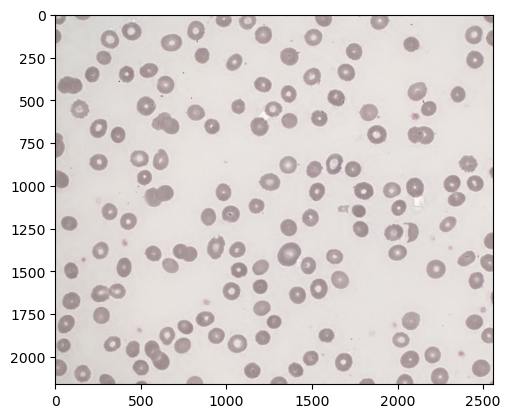

In [2]:
# Check current directory
current_directory = os.getcwd()
print('current directory = ',current_directory)

# setting the path to the directory containing the file
folder_path = current_directory+'/Yu-SMA/sma-images/'

# setting the filename
filename = 'sma_11_EDOF_RGB.tiff'

# creating the full file path
file_path = os.path.join(folder_path, filename)

# Open an image file
with Image.open(file_path) as img:
    # Display image
    plt.imshow(img)
    plt.show()

Create a dataset (pytorch) storing all images with sma 

In [3]:
# Creating the class
class ImageFileDataset(Dataset):
    def __init__(self, folder_path, transform=None):
        self.folder_path = folder_path
        self.file_list = os.listdir(folder_path)
        self.transform = transform

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        filename = self.file_list[idx]
        file_path = os.path.join(self.folder_path, filename)
        
        # Open the image file
        with Image.open(file_path) as img:
            # If there is a transform, apply it
            if self.transform:
                img = self.transform(img)
            
        return filename, img
    
# Define the transform
transform = Compose([
    # Grayscale(),   # Convert image to grayscale
    Resize((2600,2600)), # Resize image to 28x28
    ToTensor()    # Convert image to PyTorch tensor
])

# Create the datasets: One for images with SMA, one with non-SMA
dataset_sma = ImageFileDataset(current_directory+'/Yu-SMA/sma-images/', transform=transform)
dataset_non_sma = ImageFileDataset(current_directory+'/Yu-SMA/non-sma-images/', transform=transform)

# Create the DataLoader
dataloader_sma = DataLoader(dataset_sma, batch_size=1, shuffle=True)
dataloader_non_sma = DataLoader(dataset_non_sma, batch_size=1, shuffle=True)

Call images from the dataloaders

Processing file ('sma_7_EDOF_RGB.tiff',)...


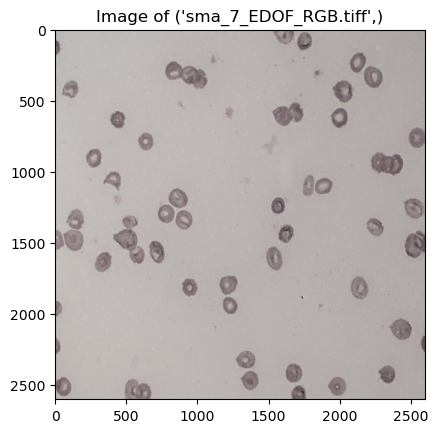

Processing file ('sma_4_EDOF_RGB.tiff',)...


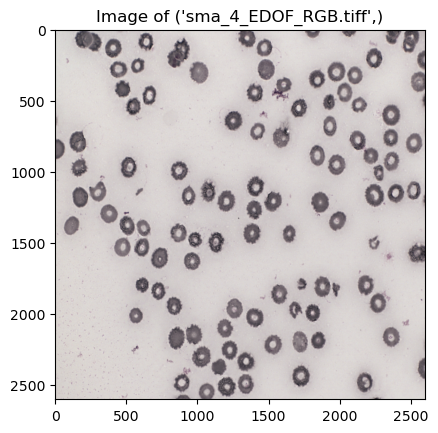

Processing file ('sma_12_EDOF_RGB.tiff',)...


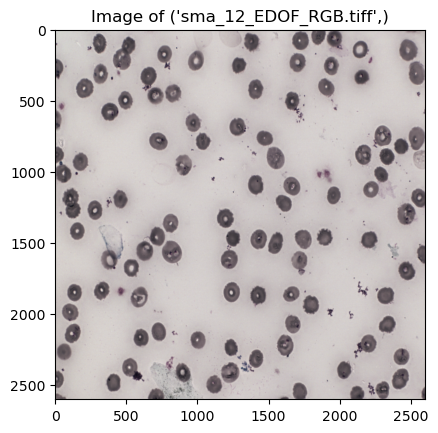

Processing file ('sma_17_EDOF_RGB.tiff',)...


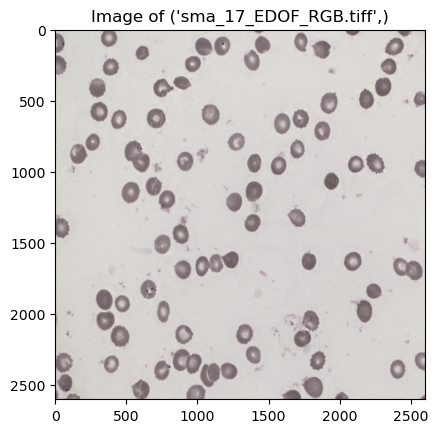

Processing file ('sma_11_EDOF_RGB.tiff',)...


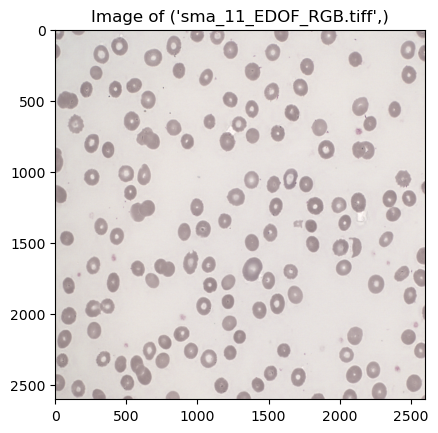

Processing file ('sma_8_EDOF_RGB.tiff',)...


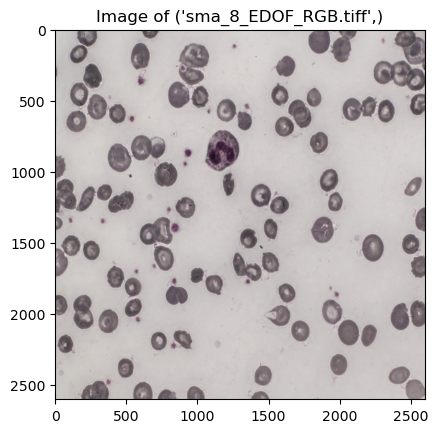

Processing file ('sma_1_EDOF_RGB.tiff',)...


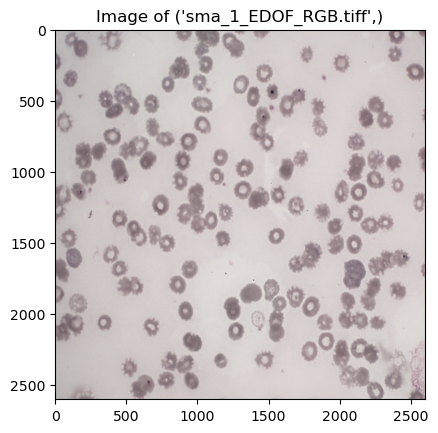

Processing file ('sma_6_EDOF_RGB.tiff',)...


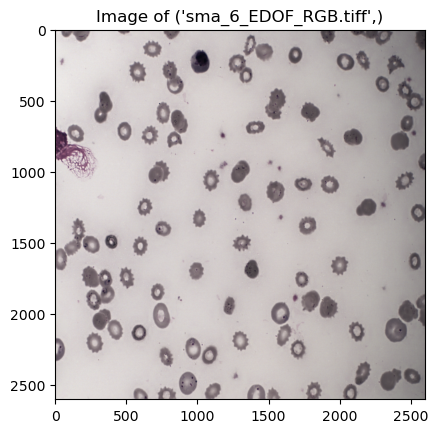

Processing file ('sma_14_EDOF_RGB.tiff',)...


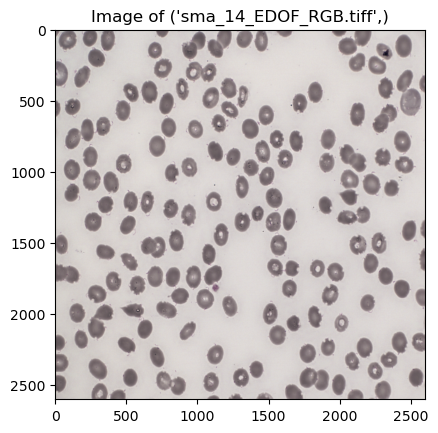

Processing file ('sma_15_EDOF_RGB.tiff',)...


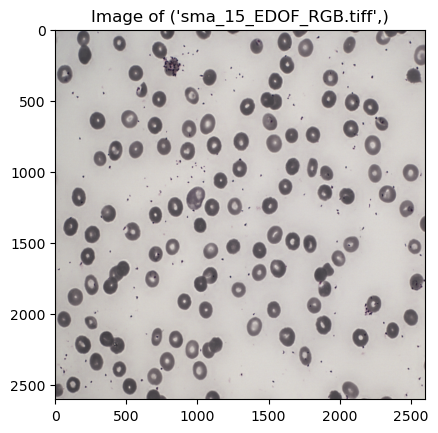

Processing file ('sma_5_EDOF_RGB.tiff',)...


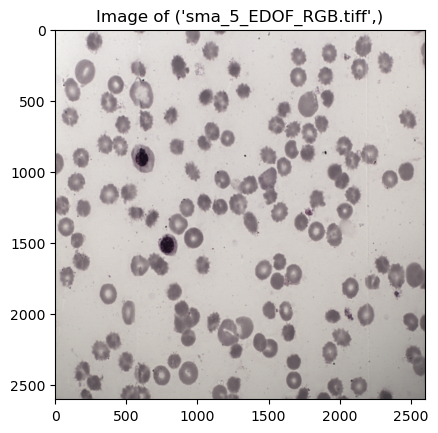

Processing file ('sma_10_EDOF_RGB.tiff',)...


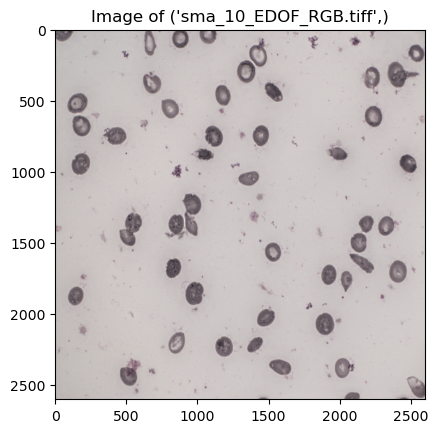

Processing file ('sma_16_EDOF_RGB.tiff',)...


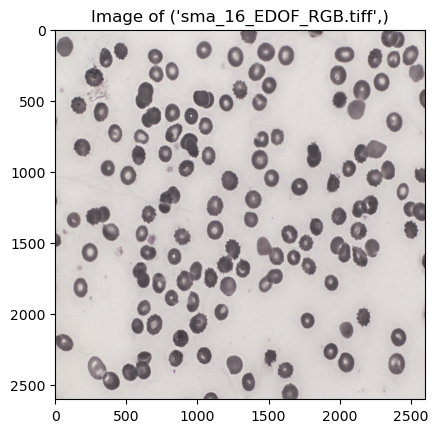

Processing file ('sma_3_EDOF_RGB.tiff',)...


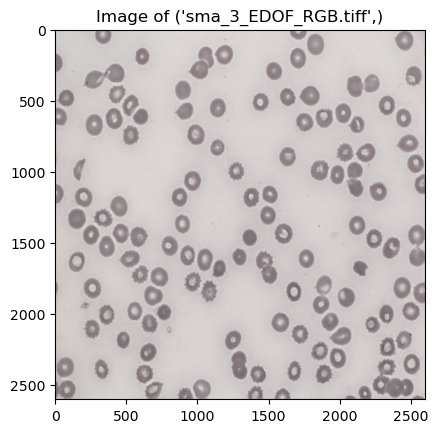

Processing file ('sma_13_EDOF_RGB.tiff',)...


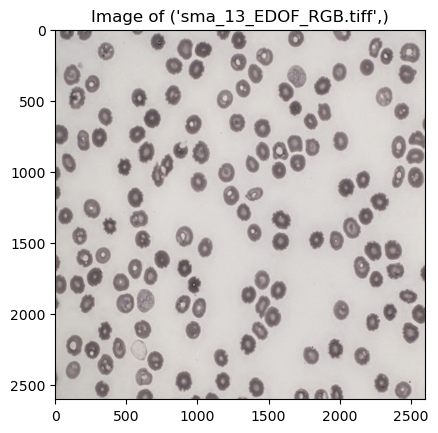

Processing file ('sma_2_EDOF_RGB.tiff',)...


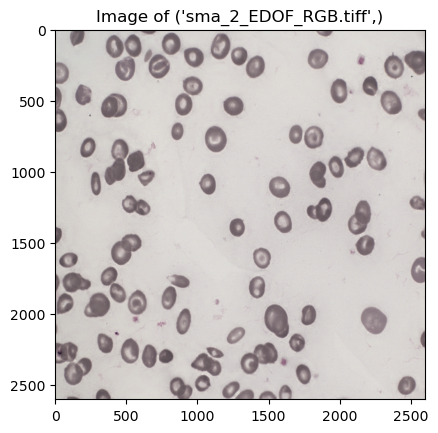

Processing file ('sma_9_EDOF_RGB.tiff',)...


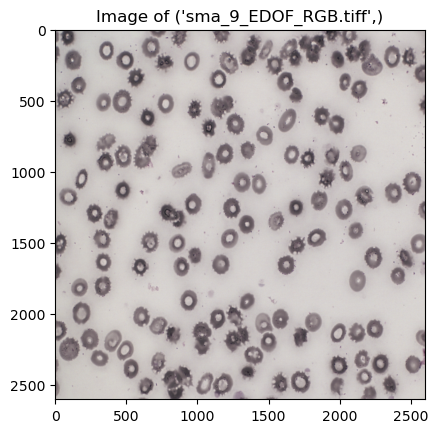

Processing file ('non-sma_13_EDOF_RGB.tiff',)...


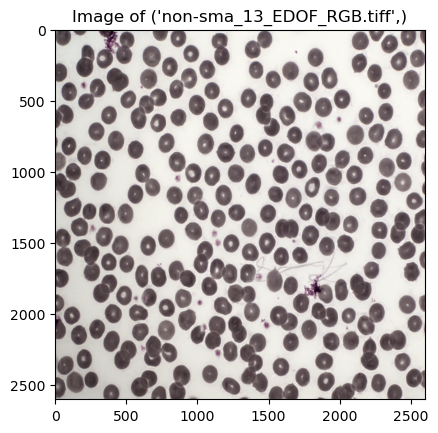

Processing file ('non-sma_11_EDOF_RGB.tiff',)...


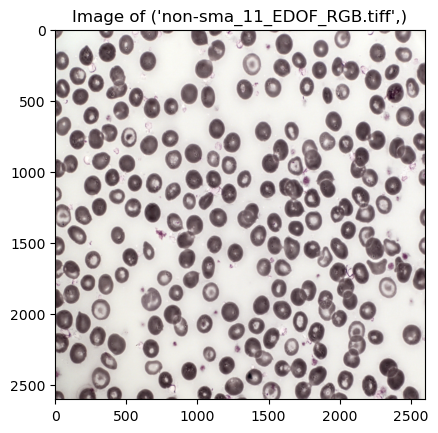

Processing file ('non-sma_6_EDOF_RGB.tiff',)...


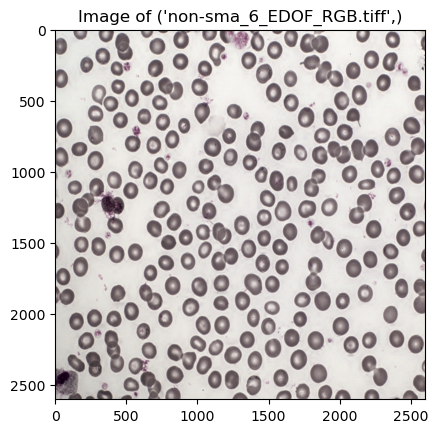

Processing file ('non-sma_12_EDOF_RGB.tiff',)...


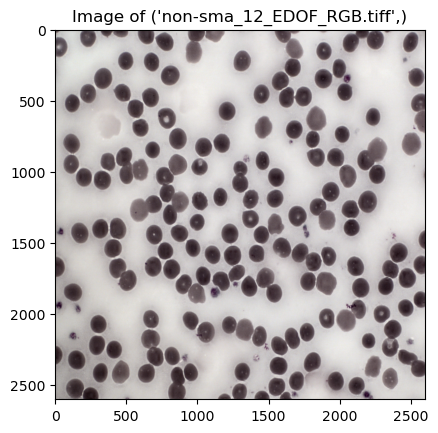

Processing file ('non-sma_1_EDOF_RGB.tiff',)...


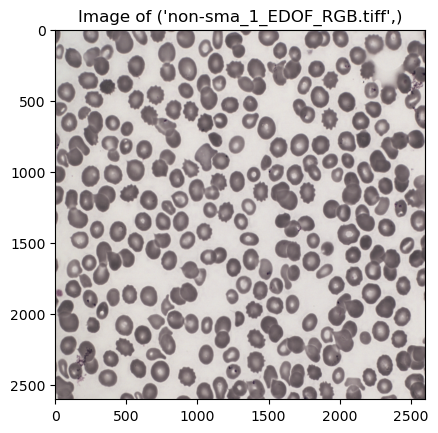

Processing file ('non-sma_9_EDOF_RGB.tiff',)...


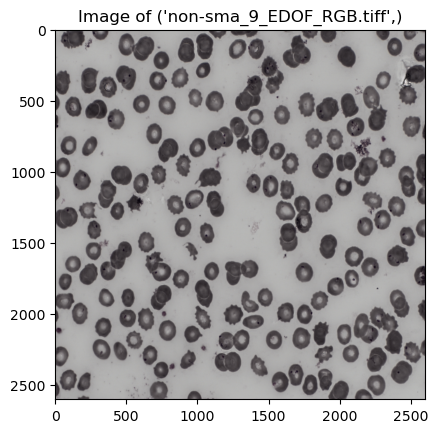

Processing file ('non-sma_14_EDOF_RGB.tiff',)...


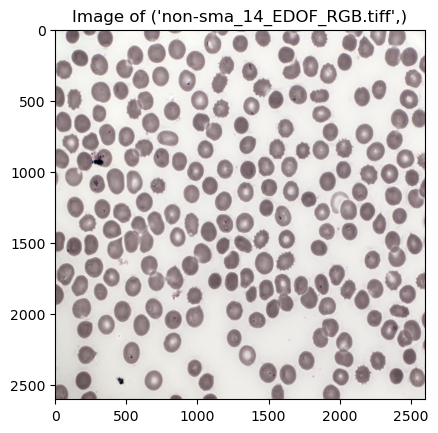

Processing file ('non-sma_7_EDOF_RGB.tiff',)...


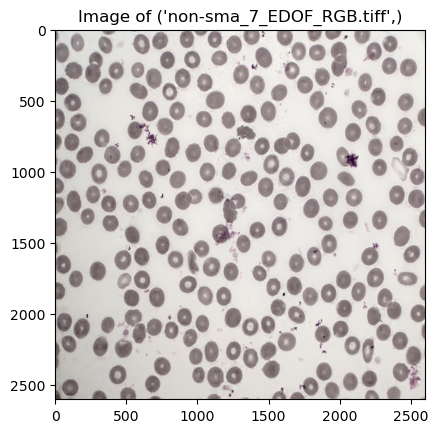

Processing file ('non-sma_4_EDOF_RGB.tiff',)...


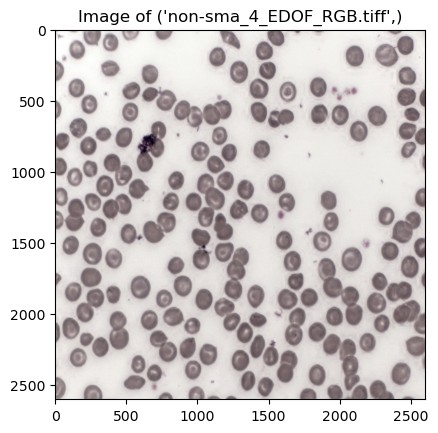

Processing file ('non-sma_16_EDOF_RGB.tiff',)...


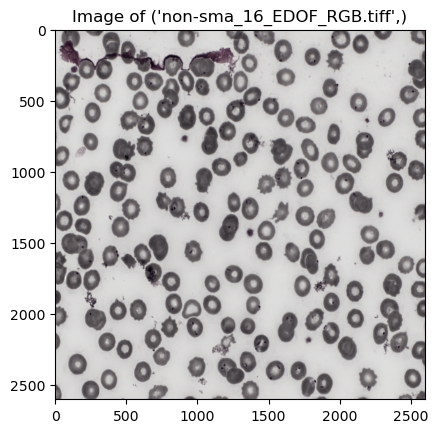

Processing file ('non-sma_10_EDOF_RGB.tiff',)...


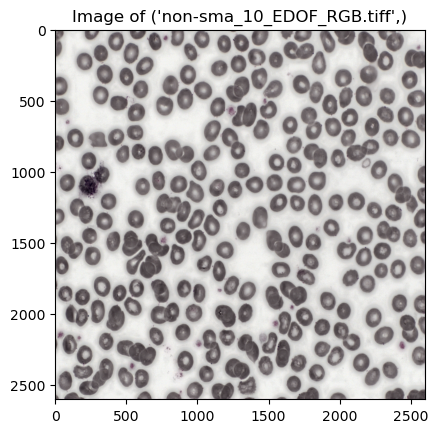

Processing file ('non-sma_5_EDOF_RGB.tiff',)...


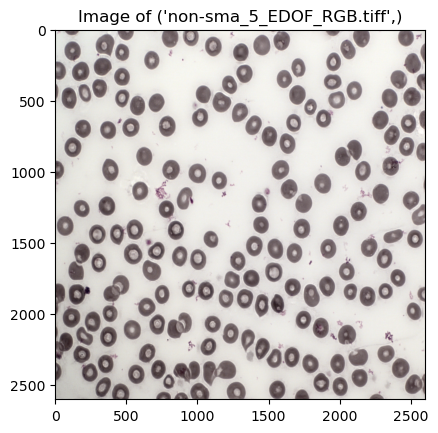

Processing file ('non-sma_8_EDOF_RGB.tiff',)...


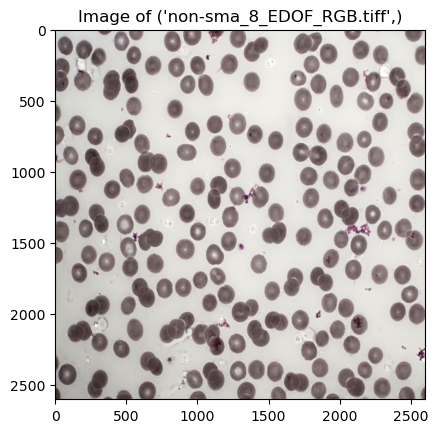

Processing file ('non-sma_3_EDOF_RGB.tiff',)...


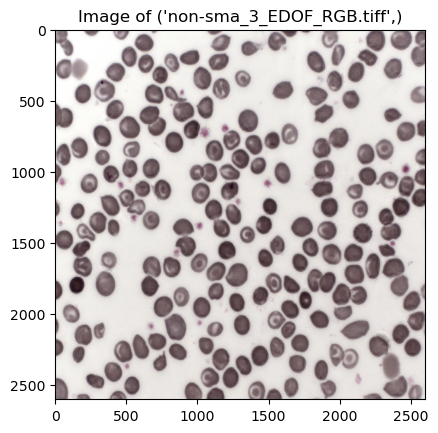

Processing file ('non-sma_15_EDOF_RGB.tiff',)...


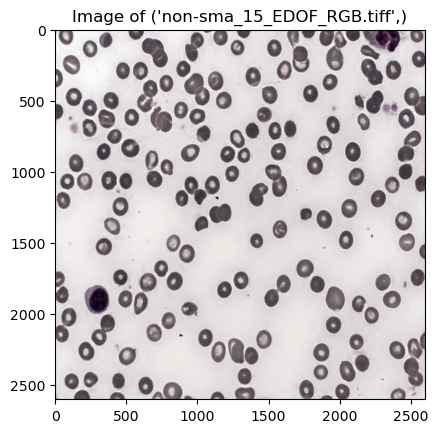

Processing file ('non-sma_2_EDOF_RGB.tiff',)...


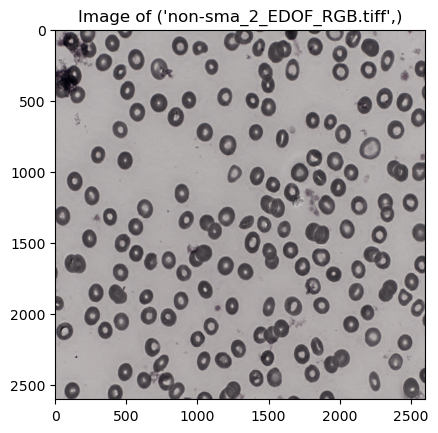

In [4]:
for i, (filename, img) in enumerate(dataloader_sma):
    print(f"Processing file {filename}...")
    
    # ... insert your image processing code here ...
    # For example, you can view the first image using matplotlib
    img = img.squeeze() # remove batch dimension
    img = img.permute(1, 2, 0) # permute to (height, width, num_channels) Need this if it is Grayscale
    plt.imshow(img)
    plt.title(f"Image of {filename}")
    plt.show()

for i, (filename, img) in enumerate(dataloader_non_sma):
    print(f"Processing file {filename}...")
    
    # ... insert your image processing code here ...
    # For example, you can view the first image using matplotlib
    
    img = img.squeeze() # remove batch dimension
    img = img.permute(1, 2, 0) # permute to (height, width, num_channels) Need this if it is Grayscale
    plt.imshow(img)
    plt.title(f"Image of {filename}")
    plt.show()